Implementation of [this paper](https://arxiv.org/abs/1511.06434)

Modified from [here](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html) 
but the implementation for the generator in this link is not the same as the above paper.

### Generative Adversarial Network (GAN)
As the name suggests GANs are made up of two "adversaries", a generator __G__ and a discriminator __D__.
Given a dataset __L__, the generator creates a new (random) sample __z__ and the discriminator decides if __z__ belongs to the dataset __L__

What makes GANs useful is that __G__ "learns" to generate samples that can fool __D__ into believing they belong to __L__

This is a two player game whose __equilibrium__ is when __G__ can generate  samples "indistinguishable" from the ones in __L__ and __D__  does not have more than a 50% chance of detecting "fakes"

Let $p_{data}$ be the (unknown) distribution of data from which we have a data set $L\subset \mathbb{R}^n$. Let $p_z$ be a distribution of random variables $z$ such that $z\in\mathbb{R}^d$. The generator G is then a map $G:\mathbb{R}^d\rightarrow \mathbb{R}^n$ and the discriminator $D:\mathbb{R}^n\rightarrow [0,1]$.

The generator $G$ implicitly defines a distribution $p_g$ where $x\sim p_g\Leftrightarrow x=G(z),z\sim p_z$

The discriminator wants to maximise its ability to discriminate between $x\in L$ and $x=G(z)$ with $z\sim p_z$. In other words, the best discriminator would have $D(x)=1$ for $x\sim p_{data}$ and $D(G(z))=0$ for $z\sim p_z$. On the other hand, $G$ wants to minimise the ability of the discriminator to distinguish between $x\sim p_{data}$ and $x\sim p_g$.

To accomplish the above [Goodfellow et. al](https://arxiv.org/abs/1406.2661) propose the following two player game __minimax__ game between $D$ and $G$

$$
\min_G\max_D V(D,G)=\mathbb{E}_{x\sim p_{data}}[\log D(x)]+\mathbb{E}_{z\sim p_z}[\log(1-D(G(z)))]

$$

It is shown in [Goodfellow et. al](https://arxiv.org/abs/1406.2661) that the solution to the game gives $p_g=p_{data}$ and $D(x)=1/2$

### Implementation

The maps $G$ and $D$ are implemented using neural networks where $D$ is a binary classifier and $G:\mathbb{R}^d\rightarrow \mathbb{R}^n$ with $d$ the dimension of the random samples and $n$ the dimension of the elements in the dataset

In [1]:

import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


Data downloaded from [here](https://drive.google.com/file/d/0B7EVK8r0v71pZjFTYXZWM3FlRnM/view?usp=drive_link&resourcekey=0-dYn9z10tMJOBAkviAcfdyQ)

In [2]:
dataroot='celeba'
image_size = 64
batch_size = 128
workers = 2
nchannels = 3
# Size of feature maps in generator
ngf = 2*image_size

# Size of feature maps in discriminator
ndf = image_size

# Number of training epochs
num_epochs =5

# Learning rate for optimizers
lr = 0.0002
# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5
# Size of z latent vector (i.e. size of generator input)
nz = 100

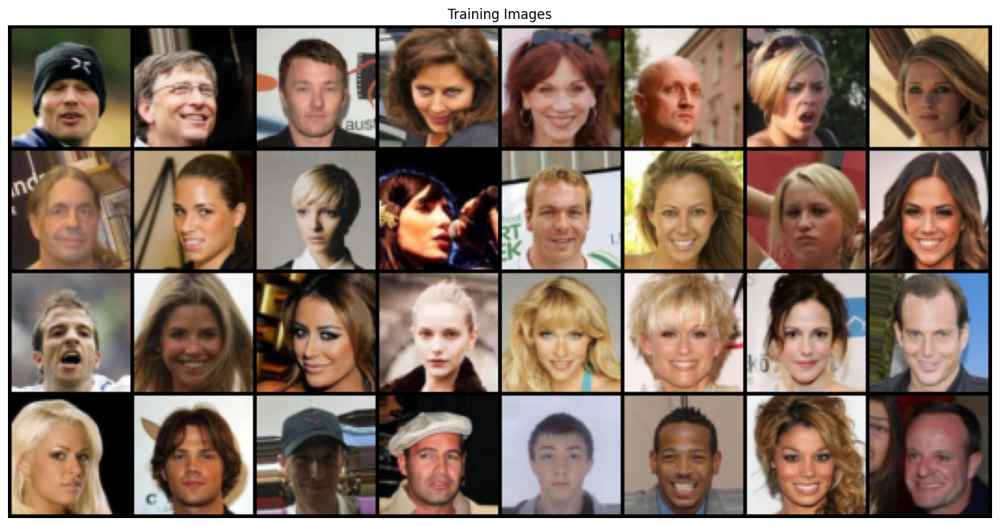

In [3]:

# We can use an image folder dataset the way we have it setup.
# Create the dataset

dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available()) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(16,16))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:32], padding=2, normalize=True).cpu(),(1,2,0)))

In [4]:
dataset.classes

['img_align_celeba']

In [5]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

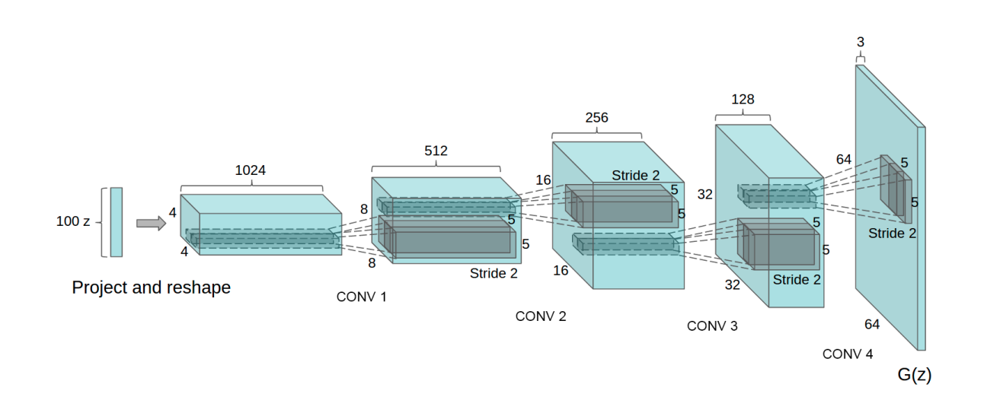

For an introduction to Convolution transpose see [here](http://d2l.ai/chapter_computer-vision/transposed-conv.html)
```
torch.nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride=1, padding=0,..., bias=True,...)
```
For input $(N,C_{in},H_{in},W_{in})$ and $(N,C_{out},H_{out},W_{out})$

Assuming the default padding=0, dilation=1 and output padding=0 we get

$H_{out}=H_{in}+K_H-1 $ and 

$W_{out}=W_{in}+K_W-1 $

For situation other than defaults see [here](https://pytorch.org/docs/stable/generated/torch.nn.ConvTranspose2d.html) 
When dilation=0 and output padding=0
$H_{out}=(H_{in}-1)\times stride_H -2\times padding_H+K_H $


In [6]:
input=torch.randn((batch_size,nz,1,1))
input.size()

torch.Size([128, 100, 1, 1])

In [7]:
layer=nn.ConvTranspose2d(nz,ngf*8,4,1,0,bias=False)
output=layer(input)
output.size()

torch.Size([128, 1024, 4, 4])

In [8]:
# Generator Code

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, 1024, 4, 1, 0, bias=False),
            nn.BatchNorm2d(1024),
            nn.ReLU(True),
            # state size. ``1024 x 4 x 4``
            nn.ConvTranspose2d(1024, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            # state size. ``512 x 8 x 8``
            nn.ConvTranspose2d( 512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            # state size. ``256 x 16 x 16``
            nn.ConvTranspose2d( 256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            # state size. ``128 x 32 x 32``
            nn.ConvTranspose2d( 128, nchannels, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nchannels) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)

In [9]:
# Create the generator
netG = Generator().to(device)

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()


In [10]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # input is ``nchannels x 64 x 64``
            nn.Conv2d(nchannels, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [11]:
# Create the Discriminator
netD = Discriminator().to(device)


# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [12]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(32, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
####real_label = 1.
###fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [13]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, (imgs,_) in enumerate(dataloader, 0):

        ############################
        # (1) Train D network: maximize log(D(x)) + log(1 - D(G(z)))
        # i.e., minimize ``-log(D(x)) - log(1 - D(G(z)))``
        # To do the minimisation we will use BCELoss
        # BCELoss(output,target) computes the average over a batch of
        # target*log(output)+(1-target)*log(1-output)
        # so to compute log(output) we call BCELoss(output,ones_like(output))
        # and to compute log(1-output) we call BCELoss(output,zeros_like(output))
        ###########################
        # Compute G(z) for fake images
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)

        # Train discriminator
        netD.zero_grad()
        imgs = imgs.to(device)
        output = netD(imgs)    
        # compute log(D(x))
        errD_real = criterion(output, torch.ones_like(output))
        errD_real.backward()
        D_x = output.mean().item()
        # compute log(1-D(G(z))) via log(D(G(z))
        # use .detach() to return a leaf tensor that is no longer
        # connected to the graph of the generator otherwise the backpropagation
        # below will update the generator weights
        output = netD(fake.detach())
        errD_fake = criterion(output, torch.zeros_like(output))
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()

        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)


       
        output = netD(fake)
        errG = criterion(output, torch.ones_like(output))
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/5][0/1583]	Loss_D: 1.3868	Loss_G: 3.4446	D(x): 0.4849	D(G(z)): 0.3423 / 0.0562
[0/5][50/1583]	Loss_D: 3.1826	Loss_G: 20.2214	D(x): 0.8337	D(G(z)): 0.8598 / 0.0000
[0/5][100/1583]	Loss_D: 0.7702	Loss_G: 4.5678	D(x): 0.7456	D(G(z)): 0.2423 / 0.0189
[0/5][150/1583]	Loss_D: 1.0189	Loss_G: 2.4337	D(x): 0.5510	D(G(z)): 0.1465 / 0.1248
[0/5][200/1583]	Loss_D: 1.3089	Loss_G: 2.6263	D(x): 0.4880	D(G(z)): 0.2254 / 0.1132
[0/5][250/1583]	Loss_D: 0.7010	Loss_G: 3.2782	D(x): 0.7458	D(G(z)): 0.2329 / 0.0581
[0/5][300/1583]	Loss_D: 1.0114	Loss_G: 1.7291	D(x): 0.6839	D(G(z)): 0.4039 / 0.2153
[0/5][350/1583]	Loss_D: 1.0907	Loss_G: 1.7420	D(x): 0.6099	D(G(z)): 0.3677 / 0.2242
[0/5][400/1583]	Loss_D: 0.7942	Loss_G: 2.3538	D(x): 0.7305	D(G(z)): 0.3203 / 0.1172
[0/5][450/1583]	Loss_D: 0.7487	Loss_G: 2.4723	D(x): 0.6510	D(G(z)): 0.1994 / 0.1211
[0/5][500/1583]	Loss_D: 0.9012	Loss_G: 3.2090	D(x): 0.7021	D(G(z)): 0.3528 / 0.0751
[0/5][550/1583]	Loss_D: 1.5082	Loss_G: 1.0335	D(x): 

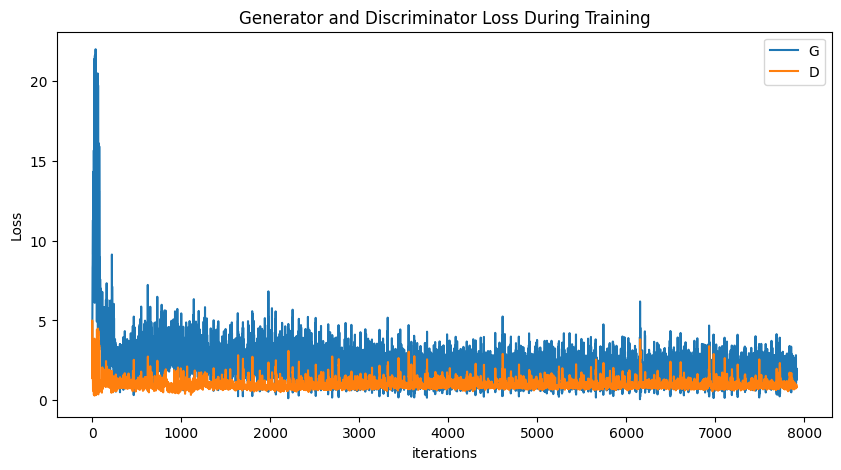

In [14]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

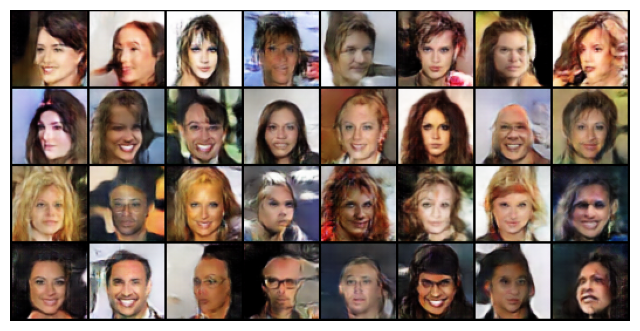

In [15]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

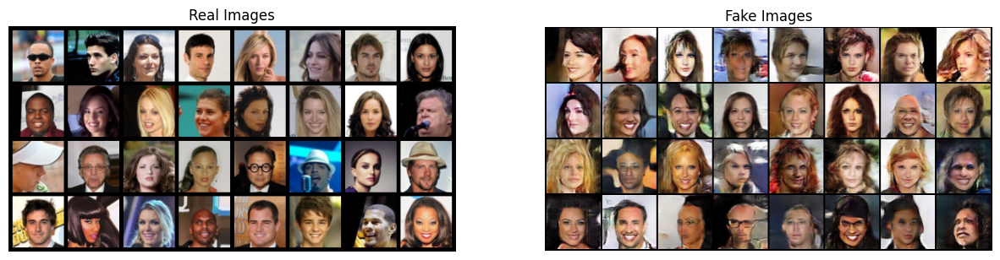

In [17]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:32], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [20]:
r=vutils.make_grid(real_batch[0].to(device)[:32], padding=5, normalize=True).cpu()

In [21]:
r.shape

torch.Size([3, 281, 557])

In [22]:
r=real_batch[0].to(device)[:32]

In [23]:
r.shape

torch.Size([32, 3, 64, 64])